<a href="https://colab.research.google.com/github/arena-grom/weed_detection/blob/main/Weed_Detection_with_Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Plant and Weed detector built with Detectron2 by Facebook.

________

### Part 1: Installation

##### **Rasterio**

In [1]:
# Libs for geospatial processing
!apt install gdal-bin python-gdal python3-gdal 
!pip install rasterio
!apt install python3-rtree 
!pip install git+git://github.com/geopandas/geopandas.git
!pip install descartes

Reading package lists... Done
Building dependency tree       
Reading state information... Done
gdal-bin is already the newest version (2.2.3+dfsg-2).
python-gdal is already the newest version (2.2.3+dfsg-2).
The following additional packages will be installed:
  python3-numpy
Suggested packages:
  python-numpy-doc python3-nose python3-numpy-dbg
The following NEW packages will be installed:
  python3-gdal python3-numpy
0 upgraded, 2 newly installed, 0 to remove and 37 not upgraded.
Need to get 2,288 kB of archives.
After this operation, 13.2 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python3-numpy amd64 1:1.13.3-2ubuntu1 [1,943 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 python3-gdal amd64 2.2.3+dfsg-2 [346 kB]
Fetched 2,288 kB in 1s (1,984 kB/s)
Selecting previously unselected package python3-numpy.
(Reading database ... 155229 files and directories currently installed.)
Preparing to unpack .../python3-numpy_

##### **Detectron2**

[Detectron2 documentation dealing with pytorch version error](https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=FsePPpwZSmqt)

##### Check GPU assigned

In [2]:
!nvidia-smi

Sun Jan 16 13:35:15 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Installing Detectron2 and its requirements. Restarting session.

In [3]:
!pip install pyyaml==5.1
!gcc --version
# workaround: install old version of pytorch since detectron2 hasn't released packages for pytorch 1.9 (issue: https://github.com/facebookresearch/detectron2/issues/3158)
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

# install detectron2 that matches pytorch 1.8
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 5.3 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=f9a359128f813b8c11270a01de68f72801a14ef81715096bb730c6187452e93b
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 763.5 MB 15 kB/s 
     |████████████████████████████████| 17.3 MB 854 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0

Check Torch version = 1.8

In [1]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.8")   # please manually install torch 1.8 if Colab changes its default version

1.8.0+cu101 True


Importing libraries

In [2]:
# general
import random, json, itertools, glob, os, sys, json
from zipfile import ZipFile
from io import BytesIO

# data science
from sklearn.utils import shuffle
import pandas as pd
import numpy as np

# image manipulation libraries
import  cv2
from google.colab.patches import cv2_imshow
from PIL import Image, ImageDraw
from PIL.TiffTags import TAGS
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# raster data handling
import rasterio
from rasterio.plot import show

In [3]:
# Detectron2
import detectron2

# setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

# import detectron2 utilities
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode

________

### Part 2: Obtaining raw image dataset

Downloading the zipped archive with images and anbnotations from Google Drive.

In [4]:
!gdown --id 12qmCbRDsI3V_a4gFD4rRpRY9P8H6nMTV

Downloading...
From: https://drive.google.com/uc?id=12qmCbRDsI3V_a4gFD4rRpRY9P8H6nMTV
To: /content/data.zip
100% 1.62G/1.62G [00:13<00:00, 122MB/s]


Print content of Zip archive

In [5]:
!unzip data.zip -d data

Archive:  data.zip
  inflating: data/weed_2.geojson     
  inflating: data/weed_1.geojson     
  inflating: data/DJI_0146.geojson   
  inflating: data/weed_6.geojson     
  inflating: data/DJI_0122.geojson   
  inflating: data/weed_4.geojson     
  inflating: data/DJI_0067.geojson   
  inflating: data/DJI_0008.geojson   
  inflating: data/DJI_0049.geojson   
  inflating: data/weed_3.geojson     
  inflating: data/DJI_0066.geojson   
  inflating: data/DJI_0025.geojson   
  inflating: data/DJI_0144.geojson   
  inflating: data/DJI_0124.geojson   
  inflating: data/weed_1.JPG         
  inflating: data/DJI_0016.tiff      
  inflating: data/DJI_0067.tiff      
  inflating: data/DJI_0008.tiff      
  inflating: data/DJI_0016.geojson   
  inflating: data/DJI_0049.tiff      
  inflating: data/weed_5.geojson     
  inflating: data/weed_8.geojson     
  inflating: data/weed_12.geojson    
  inflating: data/weed_7.geojson     
  inflating: data/weed_13.geojson    
  inflating: data/weed_14.geojs

In [6]:
!ls data/

DJI_0008.geojson  weed_17.geojson  weed_34.geojson  weed_4.geojson
DJI_0008.tiff	  weed_17.JPG	   weed_34.tiff     weed_4.JPG
DJI_0016.geojson  weed_18.geojson  weed_35.geojson  weed_50.geojson
DJI_0016.tiff	  weed_18.JPG	   weed_35.tiff     weed_50.tiff
DJI_0025.geojson  weed_19.geojson  weed_36.geojson  weed_51.geojson
DJI_0025.tiff	  weed_19.JPG	   weed_36.tiff     weed_51.tiff
DJI_0049.geojson  weed_1.geojson   weed_37.geojson  weed_52.geojson
DJI_0049.tiff	  weed_1.JPG	   weed_37.tiff     weed_52.tiff
DJI_0066.geojson  weed_21.geojson  weed_38.geojson  weed_53.geojson
DJI_0066.tiff	  weed_21.JPG	   weed_38.tiff     weed_53.tiff
DJI_0067.geojson  weed_22.geojson  weed_39.geojson  weed_54.geojson
DJI_0067.tiff	  weed_22.JPG	   weed_39.tiff     weed_54.tiff
DJI_0122.geojson  weed_23.geojson  weed_3.geojson   weed_55.geojson
DJI_0122.tiff	  weed_23.JPG	   weed_3.JPG	    weed_55.tiff
DJI_0124.geojson  weed_24.geojson  weed_40.geojson  weed_56.geojson
DJI_0124.tiff	  weed_24.JPG	   weed

TIFF image from the dataset

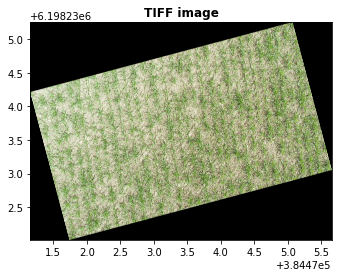

In [8]:
with rasterio.open('data/weed_30.tiff') as tiff:
  show(tiff, title='TIFF image')
  plt.show()

JPEG image from dataset

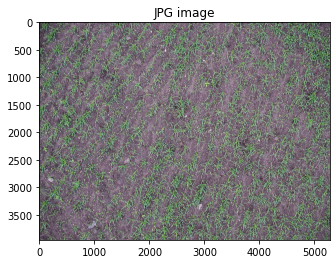

In [9]:
with Image.open('data/weed_19.JPG') as img:
  plt.imshow(img)
  plt.title('JPG image')
  plt.show()

_______________

### Part 3: Reading annotations and creating an image dataset in COCO annotation format

#### coordinates module: Functions for handling coordinates

Mostly small functions that convert pixel points to other data types, formats and structures.

In [10]:
def convert_geojson_points(coordinates):
    """
    "coordinates": [[ [367.079318072174999, -503.296073567618294, 0.0], 
                      [367.079318072174999, -653.29607356761835, 0.0]  ]] 
    to

    "points": [ (367, 503), 
                (367, 653)  ] 
    """
    # extract from list and pop last duplicated point
    points = coordinates[0][:-1]

    # if 3rd 0 point exists, pop it
    if len(points[0]) >= 3:
      points = [point[:-1] for point in points]

    # reorganize
    return [tuple([abs(round(coord)) for coord in point]) for point in points]

In [11]:
def get_bbox_from_points(polygon_points):
  """
  Function that loops over points and returns a well organized bbox
  """
  xmin, ymin, xmax, ymax = xmin_ymin_xmax_ymax(polygon_points)

  return [
          (xmin, ymin), (xmax, ymin),
          (xmax, ymax), (xmin, ymax)
          ]

In [12]:
def xmin_ymin_xmax_ymax(points):
  x = [p[0] for p in points]
  xmin, xmax = np.min(x), np.max(x)
  
  y = [p[1] for p in points]
  ymin, ymax = np.min(y), np.max(y)

  return round(xmin), round(ymin), round(xmax), round(ymax)


In [13]:
def get_centroid(points):
  x = np.mean([point[0] for point in points])
  y = np.mean([point[1] for point in points])

  return (round(x), round(y))

In [14]:
def point_within_rectangle(p, bbox_points):
  x, y = p[0], p[1]
  xmin, ymin, xmax, ymax = xmin_ymin_xmax_ymax(bbox_points)

  if (x >= xmin and x <= xmax and y >= ymin and y <= ymax):
      return True

In [15]:
def relu(x): 
  
  return max(0, x)

In [16]:
def project_polygon_to_bbox(polygon_points, bbox_points):
  x, y, _, _ = xmin_ymin_xmax_ymax(bbox_points)

  return [(relu(p[0]-x), relu(p[1]-y)) for p in polygon_points]

In [17]:
def points_to_int(points):

  return [(round(point[0]), round(point[1])) for point in points]

In [18]:
def box_to_int(bbox):
  
  return [round(point) for point in bbox]

In [19]:
def XYWH_to_XYXY(bbox):

  return [bbox[0], bbox[1], bbox[0]+bbox[2], bbox[1]+bbox[3]]

In [20]:
def get_iou_from_boxes(box1, box2):
  
  # determine the (x, y)-coordinates of the intersection rectangle
  x1, y1 = max(box1[0], box2[0]), max(box1[1], box2[1])
  x2, y2 = min(box1[2], box2[2]), max(box1[3], box2[3])
  
  # compute the area of intersection rectangle = 0 if no overlap
  inter = relu(x2 - x1 + 1) * relu(y2 - y1 + 1)
  
  if inter == 0:
    return float(0)
  
  else:
    # compute the total area
    outer1 = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    outer2 = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)
    return inter/float(outer1 + outer2 - inter)


_________________

#### visualization module: PIL image visualization/manipulation

Visualization and image manipulation can easily be done using the PIL (Pillow) library.

In [21]:
def plot_image_with_bboxes(image_path, bboxes):
    """Draw bounding boxes on top of image"""

    img = Image.open(image_path)
    img_draw = ImageDraw.Draw(img)

    for bbox in bboxes:
        img_draw.rectangle([bbox[0], bbox[2]], fill='mediumblue')

    plt.imshow(img)
    plt.title(image_path.split('/')[-1])
    plt.show()

In [22]:
def plot_image_with_points(image_path, points, r=1):
    """Draw points on top of image"""

    img = Image.open(image_path)
    img_draw = ImageDraw.Draw(img)

    for point in points:
        # draw circle (x1, y1, x2, y2)
        img_draw.ellipse((point[0]-r, point[1]-r, point[0]+r, point[1]+r), fill='magenta')

    plt.imshow(img)
    plt.title(image_path.split('/')[-1])
    plt.show()    

In [23]:
def plot_image_with_polygons(image_path, polygons, color_by='label'):
    """Draw polygons on top of image"""

    img = Image.open(image_path)
    img_draw = ImageDraw.Draw(img)

    for poly in polygons:
        if poly[color_by] == 'weed':
            color='red'
        else: color='green'     
        img_draw.polygon(poly['segmentation'], outline=color)
    
    plt.imshow(img)
    plt.title(image_path.split('/')[-1])
    plt.show()

In [24]:
def crop_image(input_image, output_image, bbox):
    """
    Function to open image, crop it, and save in new directory.
    """

    xmin, ymin, xmax, ymax = xmin_ymin_xmax_ymax(bbox)
    img = Image.open(input_image).crop((xmin, ymin, xmax, ymax))
    jpg_img = img.convert('RGB')
    jpg_img.save(output_image)

In [25]:
def get_image_size(img_path):

    return Image.open(img_path).size

___________________

#### geojson module: Parsing class for Geojson annotations

In [26]:
class GeojsonParser:
    """
    Class that reads all geojson files that correspond to a TIFF or JPG images
    in a directory and saves content into dicts.
    """

    def __init__(self, directory: str):
        self.dir = directory   
        self.annotations = []
        self.images = [f for f in glob.glob(self.dir + '/*') if 'geojson' not in f]
        self.geojsons = [f.split('.')[0] + '.geojson' for f in self.images]

        for i, geojson in enumerate(self.geojsons): # parse geojson annotations
            image = self.images[i]
            
            if 'tif' in image: # GIS transform if TIFF image
                transform = rasterio.open(image).transform 
            else: transform = None
            
            with open(geojson) as g: # load file
                features = json.load(g)['features']
            
            annotation_list = []
            for feature in features: # loop over each annotated feature
                
                an_type = feature['properties']['type'] # get label
                an_coordinates = feature['geometry']['coordinates'] # get segmentation

                if not an_type: an_type = 'plant' # add plant annotations
                
                if transform: # convert GIS annotation to pixel space
                    an_coordinates = [[self._crs_to_pixel(point, transform) for point in an_coordinates[0]]]

                an_segmentation = convert_geojson_points(an_coordinates) # format
                if an_type == 'bbox':
                    an_segmentation = get_bbox_from_points(an_segmentation)

                # print({'type': an_type,'segmentation': an_segmentation})

                annotation_list.append({
                    'type': an_type,
                    'segmentation': an_segmentation
                })
            
            self.annotations.append({
                'image': image,
                'geojson': geojson,
                'annotations': annotation_list
            })
    
    
    def count_images(self):
        return len(self.images)

    
    @staticmethod  
    def _crs_to_pixel(crs_point, affine):
        """ Conversion from geographical coordinates (CRS) to pixel space:
            crs = pixel * resolution + shift origin
        --> pixel = (crs - shift origin) / resolution
        """
        # extract shift + resolution from rasterio.Affine()
        res_x, res_y = affine[0], affine[4]
        origin_x, origin_y = affine[2], affine[5]

        # convert to pixel space
        x = (crs_point[0] - origin_x) / res_x
        y = (crs_point[1] - origin_y) / res_y

        return [x, y]



__________________
### imagedb module: Creating a new Image dataset

The idea is that high-resolution images are sent in as input together with bounding boxes and polygon annotations to parent and child classes. 

ImageDataset parses the images and annotations.

BboxDataset extracts bounding boxes annotations and generates new cropped images.

PolygonDataset extracts polygon annotations, matches each polygon to a bounding box, and projects the polygon from high-res image space to cropped space.

The final class DatasetDicts generates `dataset_dicts` with formatted annotations required by Detectron2.

#### ImageDataset parent class

In [27]:
class ImageDataset(object):
    """
    Class for creating an image dataset using TIFF and JPG images with their
    annotations in geojson format. 

    input
    directory: location of Image Dataset with geojson annotations
    annotation_dicts: generated automatically if not provided
    """

    def __init__(self, directory='.', annotation_dicts=[]):
        self.dir = directory
        self.annotation_dicts = annotation_dicts

        if not len(annotation_dicts):
            self.annotation_dicts = GeojsonParser(self.dir).annotations
        

    """
    TODO: Add some general functions for visualization, get info like
    number of images, TIF vs JPG and so on.
    """



#### BboxDataset

In [28]:
class BboxDataset(ImageDataset):
    """
    Class for cropping our new images from ImageDataset bounding boxes.

    input
    inherited from ImageDataset

    creates
    bbox_dicts: bbox annotations in high-res images
    cropped images according to bboxes
    visualizations of bboxes
    """

    def __init__(self, directory='.', annotation_dicts=[], output_folder='.', verbose=True):
        super().__init__(directory, annotation_dicts)
       
        if verbose: print('Creating BboxDataset...\n')  
        self.output_folder = output_folder
        self.bbox_dicts = []
        
        for image_annotation in self.annotation_dicts:           
            id=1
            ann_dicts = []
            image_filename = image_annotation['image']

            for feature in image_annotation['annotations']:
                if feature['type'] == 'bbox':
                    crop_filename = image_filename.split('/')[-1].split('.')[0] + '_crop' + str(id) + '.JPG'
                    crop_filename = os.path.join(output_folder, crop_filename)
                    
                    ann_dicts.append({
                        'crop_filename': crop_filename,
                        'bbox': feature['segmentation']
                    })
                    id+=1           
            self.bbox_dicts.append({
                'image_filename': image_filename,
                'bboxes': ann_dicts
            })        
            if verbose: print(f'{image_filename.split("/")[-1]} --> Found {len(ann_dicts)} boxes in image.')
        print(f'\nLooped over {len(self.annotation_dicts)} images and extracted bboxes.')

    
    def crop_images(self):
        os.makedirs(self.output_folder, exist_ok=True)
        
        i=0
        for image in self.bbox_dicts:
            for bbox in image['bboxes']:
                crop_image(image['image_filename'], bbox['crop_filename'], bbox['bbox'])
                i+=1 
        
        print(f'New dataset with {i} images has been generated in >{self.output_folder}')


    def visualize_bboxes(self, n=5):            
        for bboxes in random.sample(self.bbox_dicts, n):
            bbox_input = [bbox['bbox'] for bbox in bboxes['bboxes']]
            plot_image_with_bboxes(bboxes['image_filename'], bbox_input)


    def visualize_dots(self, n=5, r=50):
        for bboxes in random.sample(self.bbox_dicts, n):
            bbox_input = [bbox['bbox'] for bbox in bboxes['bboxes']]
            point_list = []
            [[point_list.append(point) for point in bbox] for bbox in bbox_input] 
            plot_image_with_points(bboxes['image_filename'], point_list, r)
    

In [29]:
bbox_dataset = BboxDataset(directory='data', output_folder='crop_images')

Creating BboxDataset...

weed_1.JPG --> Found 2 boxes in image.
weed_46.tiff --> Found 5 boxes in image.
DJI_0016.tiff --> Found 2 boxes in image.
weed_44.tiff --> Found 2 boxes in image.
weed_13.JPG --> Found 1 boxes in image.
weed_29.JPG --> Found 1 boxes in image.
weed_3.JPG --> Found 3 boxes in image.
weed_35.tiff --> Found 3 boxes in image.
weed_24.JPG --> Found 1 boxes in image.
weed_38.tiff --> Found 3 boxes in image.
weed_39.tiff --> Found 3 boxes in image.
weed_36.tiff --> Found 2 boxes in image.
weed_56.tiff --> Found 3 boxes in image.
weed_52.tiff --> Found 3 boxes in image.
DJI_0066.tiff --> Found 2 boxes in image.
weed_16.JPG --> Found 2 boxes in image.
weed_60.tiff --> Found 4 boxes in image.
weed_31.tiff --> Found 3 boxes in image.
weed_45.tiff --> Found 3 boxes in image.
DJI_0146.tiff --> Found 3 boxes in image.
DJI_0067.tiff --> Found 2 boxes in image.
weed_34.tiff --> Found 4 boxes in image.
weed_57.tiff --> Found 2 boxes in image.
weed_58.tiff --> Found 1 boxes in im

Example entry in bbox_dicts

In [30]:
bbox_dataset.bbox_dicts[-1]

{'bboxes': [{'bbox': [(2450, 867), (2816, 867), (2816, 1044), (2450, 1044)],
   'crop_filename': 'crop_images/weed_51_crop1.JPG'},
  {'bbox': [(1385, 1210), (1677, 1210), (1677, 1472), (1385, 1472)],
   'crop_filename': 'crop_images/weed_51_crop2.JPG'},
  {'bbox': [(961, 3635), (1096, 3635), (1096, 3777), (961, 3777)],
   'crop_filename': 'crop_images/weed_51_crop3.JPG'}],
 'image_filename': 'data/weed_51.tiff'}

Check that bboxes are not tilted --> makes life a lot easier

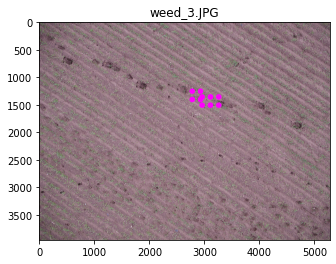

In [31]:
bbox_dataset.visualize_dots(n=1)

Visualize some of the extracted bounding boxes

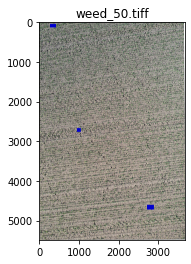

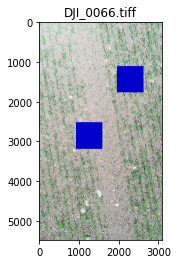

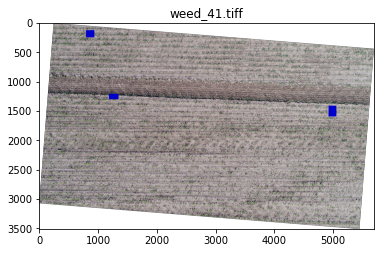

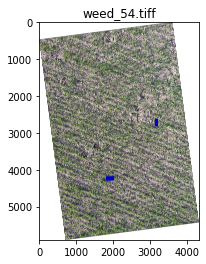

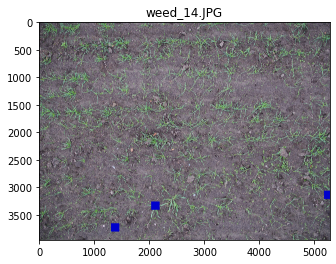

In [67]:
bbox_dataset.visualize_bboxes()

Crop images and save as JPG (takes a while)

In [32]:
bbox_dataset.crop_images()

New dataset with 200 images has been generated in >crop_images


#### PolygonDataset

In [34]:
class PolygonDataset(ImageDataset):
    """
    Class for projecting polygont onto new image space created by BboxDataset.
    Annotation segmentation extracted from ImageDataset features.

    input
    inherited from ImageDataset
    calls for bbox_dicts from BboxDataset

    creates
    polygon_dicts: polygon annotations in cropped images
    """
    
    def __init__(self, directory='.', annotation_dicts=[], bbox_dicts=[], verbose=True):
        super().__init__(directory, annotation_dicts)

        if not len(bbox_dicts): # create bbox_dicts if missing
            self.bbox_dicts = BboxDataset(directory, annotation_dicts, verbose=False).bbox_dicts
        else: self.bbox_dicts = bbox_dicts
        
        print('\nExtracting all polygons and matching to bbox...\n')
        self.polygon_dicts = []
        
        for image_annotation in self.annotation_dicts:
            image = image_annotation['image']
            bboxes = next((d for d in self.bbox_dicts if d['image_filename'] == image), None)
            bboxes = bboxes['bboxes'] # extracted bbox annotations for same image

            for feature in image_annotation['annotations']: # loop over polygons
                if feature['type'] != 'bbox':
                    polygon = feature['segmentation']
                    centroid = get_centroid(polygon)
                    
                    match=False
                    for bbox in bboxes: # find in what bbox polygon is located       
                        if point_within_rectangle(centroid, bbox['bbox']):
                            match=True
                            poly_dict = {
                                'crop_filename': bbox['crop_filename'],
                                'segmentation': project_polygon_to_bbox(polygon, bbox['bbox']),
                                'label': feature['type']
                            }
                            self.polygon_dicts.append(poly_dict)
                                         
                    if not match and verbose: print('--> Skipping polygon outside boxes...')
            
            if verbose: print(f'{image.split("/")[-1]} --> Found {len(self.polygon_dicts)} polygons in image.\n')

        print(f'Looped over {len(self.annotation_dicts)} images and extraxted polygons.')

    def visualize(self, n=5):
        images = list(set([ann['crop_filename'] for ann in self.polygon_dicts]))
        for image in random.sample(images, n):
            polygons = [ann for ann in self.polygon_dicts if ann['crop_filename'] == image]
            plot_image_with_polygons(image, polygons)




Generate polygon dicts and show annotations in new cropped images

In [35]:
polygons = PolygonDataset(directory='data', bbox_dicts=bbox_dataset.bbox_dicts)


Extracting all polygons and matching to bbox...

--> Skipping polygon outside boxes...
weed_1.JPG --> Found 13 polygons in image.

weed_46.tiff --> Found 57 polygons in image.

DJI_0016.tiff --> Found 111 polygons in image.

weed_44.tiff --> Found 140 polygons in image.

weed_13.JPG --> Found 148 polygons in image.

weed_29.JPG --> Found 159 polygons in image.

--> Skipping polygon outside boxes...
weed_3.JPG --> Found 191 polygons in image.

weed_35.tiff --> Found 218 polygons in image.

weed_24.JPG --> Found 219 polygons in image.

weed_38.tiff --> Found 240 polygons in image.

weed_39.tiff --> Found 281 polygons in image.

weed_36.tiff --> Found 300 polygons in image.

weed_56.tiff --> Found 323 polygons in image.

weed_52.tiff --> Found 342 polygons in image.

DJI_0066.tiff --> Found 509 polygons in image.

--> Skipping polygon outside boxes...
weed_16.JPG --> Found 529 polygons in image.

weed_60.tiff --> Found 558 polygons in image.

weed_31.tiff --> Found 588 polygons in image.

Example of a polygon annotation

In [36]:
polygons.polygon_dicts[0]

{'crop_filename': 'crop_images/weed_1_crop1.JPG',
 'label': 'weed',
 'segmentation': [(20, 60),
  (17, 59),
  (14, 58),
  (12, 56),
  (13, 53),
  (14, 52),
  (17, 52),
  (20, 54),
  (21, 56),
  (22, 58)]}

Visualize some of the annotations in new images

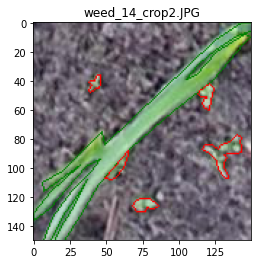

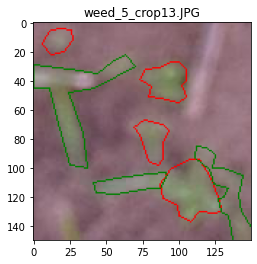

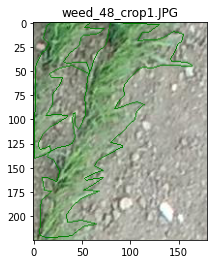

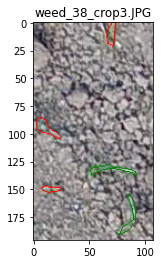

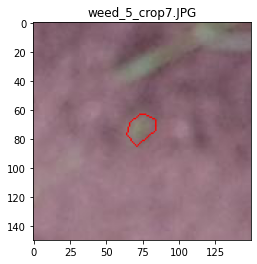

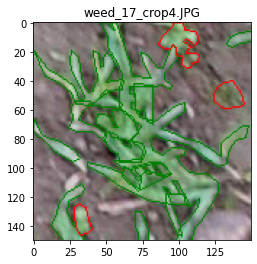

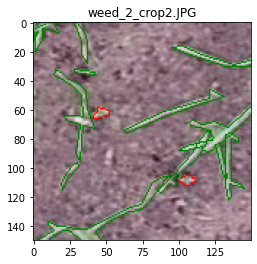

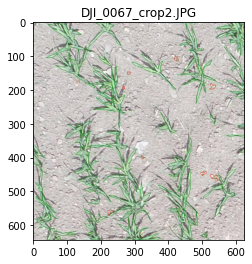

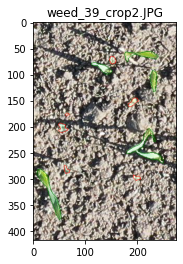

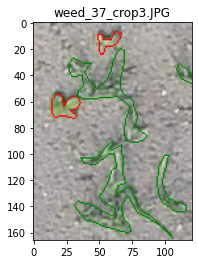

In [37]:
polygons.visualize(n=10)

#### DatasetDicts

Combines bbox_dicts from BboxDataset and polygon_dicts from PolygonDataset.

In [38]:
class DatasetDicts:
    """
    Class for creating Detectron2 dataset_dicts
    
    input
    bbox_dicts:
    polygon_dicts:

    creates
    dataset_dicts
    """

    def __init__(self, bbox_dicts, polygon_dicts, detectron_installed=False):
        self.classes = ['weed', 'plant']
        self.dataset_dicts = []
        print('\nBuilding dataset_dicts for Detectron2\n')
        
        id=0
        for image in bbox_dicts:
            for crop_image in image['bboxes']: # iterate over each cropped image             
                filename = crop_image['crop_filename']
                width, height = get_image_size(filename)
                polygons_in_image = [poly for poly in polygon_dicts if poly['crop_filename'] == filename] # extract corresponding polygons

                record = {}
                record['file_name'] = filename              
                record['width'] = round(width)
                record['height'] = round(height)
                record['image_id'] = id
                id+=1

                record_polygons = []
                for poly in polygons_in_image:
                    if poly['label'] == 'pkant':
                      poly['label'] == 'plant'
                    poly_points = poly['segmentation']
                    
                    p = {}
                    if poly['label'] == 'weed': p['category_id'] = 0
                    else: p['category_id'] = 1
                    p['segmentation'] = [list(itertools.chain.from_iterable(poly_points))]
                    p['bbox'] = list(xmin_ymin_xmax_ymax(poly_points))
                    p['iscrowd'] = 0
                    if detectron_installed: p['bbox_mode'] = BoxMode.XYXY_ABS
                    
                    record_polygons.append(p)

                record['annotations'] = record_polygons    
                self.dataset_dicts.append(record)

        # TODO: save as a json file in output_folder
        print('All done! Dataset created for Mask R-CNN training!')




In [39]:
dataset_dicts = DatasetDicts(bbox_dataset.bbox_dicts, polygons.polygon_dicts, detectron_installed=True).dataset_dicts


Building dataset_dicts for Detectron2

All done! Dataset created for Mask R-CNN training!


Save `dataset_dicts`

In [40]:
with open('crop_images/dataset_dicts.json', 'w') as f:
    json.dump(dataset_dicts, f) 

______________________________

### Part 4: Transfer Learning with **Detectron2** 


In [43]:
dir = '.crop_images/'

#### Creating train/val/test sets for Detectron2
* Read `dataset_dicts`
* Manually adjust bbox_mode and removal of blurry images
* Split data into train/val/test
* Register datasets to Detectron2

Adjust `dataset_dicts`

In [44]:
# annotation example
dataset_dicts[0]['annotations'][-1]

{'bbox': [41, 92, 92, 115],
 'bbox_mode': <BoxMode.XYXY_ABS: 0>,
 'category_id': 0,
 'iscrowd': 0,
 'segmentation': [[89,
   107,
   82,
   109,
   77,
   111,
   73,
   114,
   70,
   115,
   67,
   115,
   65,
   111,
   64,
   110,
   59,
   111,
   53,
   113,
   50,
   110,
   50,
   107,
   45,
   106,
   42,
   103,
   41,
   100,
   42,
   96,
   43,
   92,
   44,
   92,
   47,
   95,
   48,
   100,
   49,
   103,
   53,
   104,
   58,
   100,
   62,
   99,
   67,
   100,
   70,
   98,
   71,
   97,
   75,
   96,
   76,
   99,
   78,
   104,
   81,
   104,
   87,
   102,
   90,
   102,
   92,
   104,
   91,
   107]]}

#### Add bounding box mode

In [45]:
for dict_entry in dataset_dicts:
    for ann_entry in dict_entry['annotations']:
        ann_entry['bbox_mode'] = BoxMode.XYXY_ABS

In [46]:
# annotation example
dataset_dicts[0]['annotations'][-1]

{'bbox': [41, 92, 92, 115],
 'bbox_mode': <BoxMode.XYXY_ABS: 0>,
 'category_id': 0,
 'iscrowd': 0,
 'segmentation': [[89,
   107,
   82,
   109,
   77,
   111,
   73,
   114,
   70,
   115,
   67,
   115,
   65,
   111,
   64,
   110,
   59,
   111,
   53,
   113,
   50,
   110,
   50,
   107,
   45,
   106,
   42,
   103,
   41,
   100,
   42,
   96,
   43,
   92,
   44,
   92,
   47,
   95,
   48,
   100,
   49,
   103,
   53,
   104,
   58,
   100,
   62,
   99,
   67,
   100,
   70,
   98,
   71,
   97,
   75,
   96,
   76,
   99,
   78,
   104,
   81,
   104,
   87,
   102,
   90,
   102,
   92,
   104,
   91,
   107]]}

##### Optional: Remove blurry images from *weed_4* and *weed_5*

In [ ]:
to_remove = ['weed_4_', 'weed_5_']

reduced_dicts = []
for dict_entry in dataset_dicts:
    if not any(substring in dict_entry['file_name'] for substring in to_remove):
        reduced_dicts.append(dict_entry)

dataset_dicts = reduced_dicts

In [ ]:
[d['file_name'] for d in dataset_dicts]

#### Split data

In [47]:
print(f'Dataset consists of {len(dataset_dicts)} images with annotations')
print('Splitting to 70%/15%/15% train and test sets after shuffle.\n')

original_dataset_dicts = dataset_dicts.copy()                 # save original
dataset_dicts = shuffle(dataset_dicts, random_state=0)        # shuffle

n_train = int((len(dataset_dicts)+1)*.70)                     # define n_samples
n_val = int((len(dataset_dicts)+1)*.15)
n_test = len(dataset_dicts)-n_train-n_val

text = f"From {len(dataset_dicts)} samples, {n_train} are used for train, {n_val} for validation and {n_test} for test"
print(text)


Dataset consists of 200 images with annotations
Splitting to 70%/15%/15% train and test sets after shuffle.

From 200 samples, 140 are used for train, 30 for validation and 30 for test


#### Register datasets 
Using get_dataset() that splits image dataset to train/val/test

In [48]:
def get_dataset(dataset_dicts, start_index, end_index):
    """
    Function to extract a dataset from dataset_dicts
    """
    return dataset_dicts[start_index:end_index]


In [49]:
classes = ['weed', 'plant']

datasets = {
    'train': (0, n_train),
    'val': (n_train, n_train + n_val),
    'test': (n_train + n_val, n_train + n_val + n_test)
}

for d in datasets:
    DatasetCatalog.register(d, lambda d=d: get_dataset(dataset_dicts, datasets[d][0], datasets[d][1]))
    MetadataCatalog.get(d).set(thing_classes=classes)

In [50]:
statement_metadata = MetadataCatalog.get('train')
statement_metadata

Metadata(name='train', thing_classes=['weed', 'plant'])

#### Obtain image catalogs

In [51]:
train_dataset_dicts = DatasetCatalog.get('train')
val_dataset_dicts = DatasetCatalog.get('val')
test_dataset_dicts = DatasetCatalog.get('test')

### Visualize Detectron2 datasets with cv2



In [52]:
def visualize_detectron2_image(dataset_dict, metadata, predictor=None, scale=1, save=False, path='.'):
    """
    Function to visualize images with polygon annotations registered in Detectron2
    """
    filename = dataset_dict['file_name']
    img = cv2.imread(filename) # get image

    if not predictor:
        print(f'Image: {filename.split("/")[-1]}')
        visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=scale)
        vis = visualizer.draw_dataset_dict(dataset_dict)
        img_vis = vis.get_image()[:, :, ::-1]
        folder = os.path.join(path, 'annotated_images')
    else:
        print(f'Predicted Image: {filename.split("/")[-1]}')
        outputs = predictor(img)
        visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=scale)
        instances = outputs['instances'].to('cpu')
        vis = visualizer.draw_instance_predictions(instances)
        img_vis = vis.get_image()[:, :, ::-1]
        folder = os.path.join(path, 'predicted_images')
      
    if save:    
        os.makedirs(folder, exist_ok=True)
        new_filename = os.path.join(folder, filename.split('/')[-1])
        write_img = cv2.imwrite(new_filename, img_vis)
  
    # visualize
    cv2_imshow(img_vis)



#### Show images from train datset

Image: weed_49_crop1.JPG


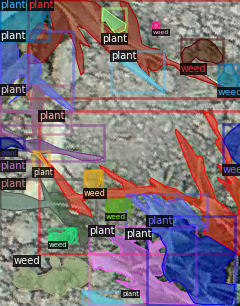

Image: weed_13_crop1.JPG


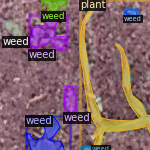

Image: weed_10_crop20.JPG


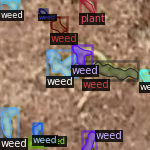

Image: weed_50_crop2.JPG


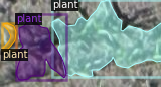

Image: weed_5_crop6.JPG


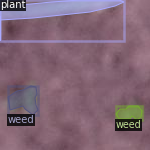

In [53]:
for d in random.sample(train_dataset_dicts, 5):
    visualize_detectron2_image(d, statement_metadata)

#### Show images from val datset

Image: DJI_0066_crop1.JPG


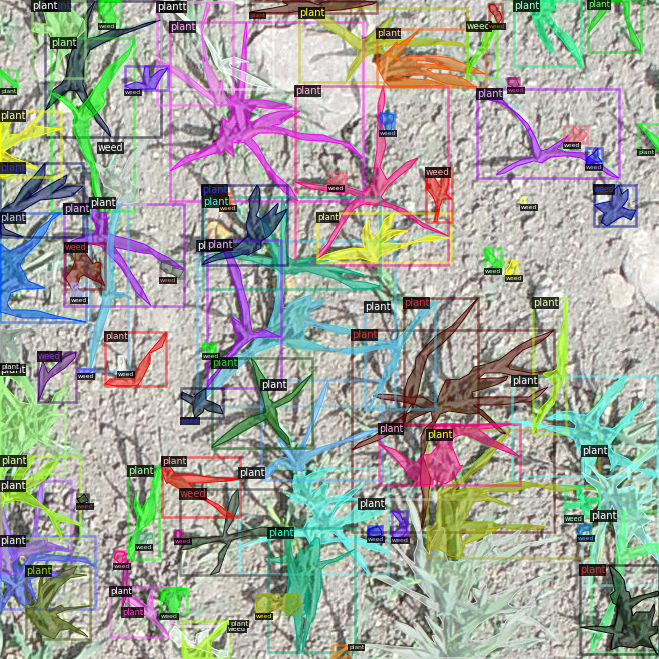

Image: weed_5_crop11.JPG


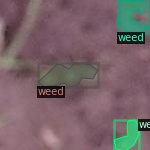

Image: weed_52_crop1.JPG


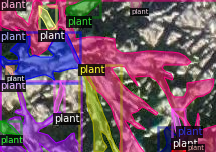

Image: weed_5_crop8.JPG


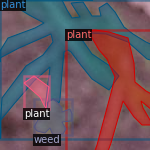

Image: weed_59_crop1.JPG


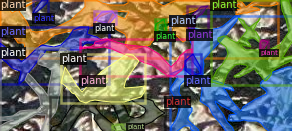

In [54]:
for d in random.sample(val_dataset_dicts, 5):
    visualize_detectron2_image(d, statement_metadata, scale=1)

#### Show images from test datset

Image: weed_5_crop9.JPG


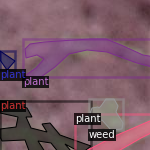

Image: DJI_0122_crop2.JPG


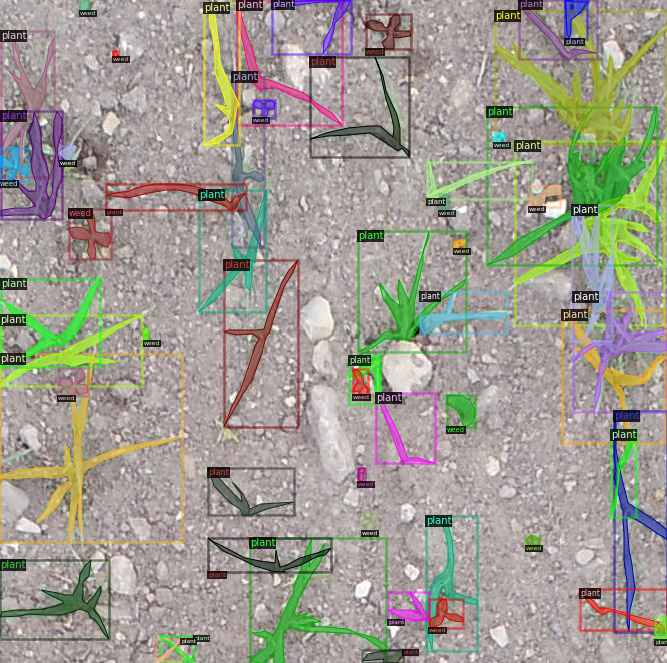

Image: weed_39_crop3.JPG


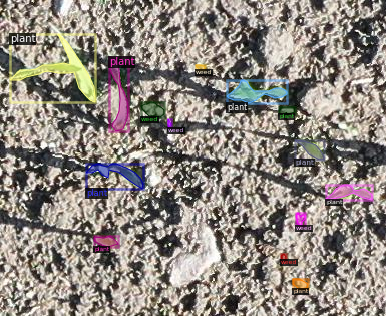

Image: weed_17_crop1.JPG


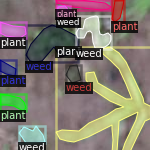

Image: weed_15_crop1.JPG


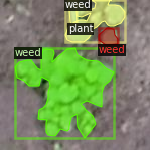

In [57]:
for d in random.sample(test_dataset_dicts, 5):
    visualize_detectron2_image(d, statement_metadata, scale=1)

It works!

### Transfer learning Mask R-CNN pre-trained on MS COCO Dataset

__Available pre-trained models for Instance Segmentation:__
* mask_rcnn_R_101_C4_3x.yaml
* mask_rcnn_R_101_FPN_3x.yaml                 (_fast_)
* mask_rcnn_R_101_DC5_3x.yaml

* mask_rcnn_R_50_C4_1x.yaml
* mask_rcnn_R_50_C4_3x.yaml

* mask_rcnn_R_50_DC5_1x.yaml
* mask_rcnn_R_50_DC5_3x.yaml

* mask_rcnn_R_50_FPN_1x.yaml                  (_fast_)
* mask_rcnn_R_50_FPN_1x_giou.yaml             (_skip_)
* mask_rcnn_R_50_FPN_3x.yaml                  (_fast_)

* mask_rcnn_X_101_32x8d_FPN_3x.yaml           (_skip_)

#### Setting parameters

In [58]:
cfg = get_cfg()
config_file = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"

# get cfg from model zoo
cfg.merge_from_file(model_zoo.get_config_file(config_file))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(config_file)

# train and test
cfg.DATASETS.TRAIN = ('train',)
cfg.DATASETS.TEST = ('val',)            # ('val',) or () empty for no validation
cfg.DATALOADER.NUM_WORKERS = 2

# parameters to tune
cfg.SOLVER.IMS_PER_BATCH = 2            # 2 or 4 (not here)
cfg.SOLVER.BASE_LR = 0.001              # 0.00025 - 0.005, decrease for fitting
cfg.SOLVER.WARMUP_ITERS = 100           # 500 or 1000
cfg.SOLVER.MAX_ITER = 1000              # warmup+eval. adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = []                   # [] or (WARMUP_ITERS, MAX_ITER)
cfg.SOLVER.GAMMA = 0.05

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)
cfg.TEST.EVAL_PERIOD = 200              # when validation

"""
The code currently train for around 12 epochs of COCO with default values.
The reason is that the number of iterations also take into account the batch size and the number of GPUs.

So for 90k iterations with a batch size of 2 and 8 GPUs, we have 90k x 2 x 8 = 1.4M images seen
"""

'\nThe code currently train for around 12 epochs of COCO with default values.\nThe reason is that the number of iterations also take into account the batch size and the number of GPUs.\n\nSo for 90k iterations with a batch size of 2 and 8 GPUs, we have 90k x 2 x 8 = 1.4M images seen\n'

Modify DefaultTrainer to be able to implement a validation procedure (according to [Roboflow Cell Detection](https://blog.roboflow.com/how-to-train-detectron2/) and [Curiousily Face Detection](https://curiousily.com/posts/face-detection-on-custom-dataset-with-detectron2-in-python/)) 

In [59]:
class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("eval", exist_ok=True)
        output_folder = "eval"
        
    return COCOEvaluator(dataset_name, cfg, False, output_folder)

#### Training

In [60]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)              # CocoTrainer(cfg) or DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()                         # Make train

[01/16 14:06:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:04, 37.4MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[01/16 14:06:47 d2.engine.train_loop]: Starting training from iteration 0
[01/16 14:07:10 d2.utils.events]:  eta: 0:17:01  iter: 19  total_loss: 3.064  loss_cls: 0.9471  loss_box_reg: 0.8912  loss_mask: 0.6903  loss_rpn_cls: 0.3918  loss_rpn_loc: 0.1032  time: 1.0709  data_time: 0.0463  lr: 0.00019081  max_mem: 2767M
[01/16 14:07:33 d2.utils.events]:  eta: 0:17:22  iter: 39  total_loss: 2.422  loss_cls: 0.6706  loss_box_reg: 0.8708  loss_mask: 0.6331  loss_rpn_cls: 0.1362  loss_rpn_loc: 0.07308  time: 1.1246  data_time: 0.0161  lr: 0.00039061  max_mem: 2767M
[01/16 14:07:56 d2.utils.events]:  eta: 0:16:46  iter: 59  total_loss: 2.32  loss_cls: 0.6453  loss_box_reg: 0.8946  loss_mask: 0.5216  loss_rpn_cls: 0.1161  loss_rpn_loc: 0.08931  time: 1.1257  data_time: 0.0122  lr: 0.00059041  max_mem: 2767M
[01/16 14:08:21 d2.utils.events]:  eta: 0:16:52  iter: 79  total_loss: 2.079  loss_cls: 0.5695  loss_box_reg: 0.8495  loss_mask: 0.3976  loss_rpn_cls: 0.1098  loss_rpn_loc: 0.154  time: 1.16

##### Tensorboard

In [61]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

#### Test set predictions

In [62]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # detection threshold
predictor = DefaultPredictor(cfg)

In [63]:
dataset = 'test'
evaluator = COCOEvaluator(dataset, cfg, False, output_dir="./output/")
loader = build_detection_test_loader(cfg, dataset)
inference_on_dataset(trainer.model, loader, evaluator)

WARNING [01/16 14:27:04 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[01/16 14:27:04 d2.evaluation.coco_evaluation]: Trying to convert 'test' to COCO format ...
[01/16 14:27:04 d2.data.datasets.coco]: Converting annotations of dataset 'test' to COCO format ...)
[01/16 14:27:04 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[01/16 14:27:04 d2.data.datasets.coco]: Conversion finished, #images: 30, #annotations: 345
[01/16 14:27:04 d2.data.datasets.coco]: Caching COCO format annotations at './output/test_coco_format.json' ...
[01/16 14:27:04 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|    weed    | 176          |   plant    | 169          |
|            |              |            |              |
|   total    | 345          |        

OrderedDict([('bbox',
              {'AP': 20.102016293728763,
               'AP-plant': 15.092209577620174,
               'AP-weed': 25.11182300983735,
               'AP50': 48.392682680035634,
               'AP75': 11.990921271384043,
               'APl': 50.0,
               'APm': 19.662587865935297,
               'APs': 22.635098717825418}),
             ('segm',
              {'AP': 16.08398882955975,
               'AP-plant': 8.426488999845139,
               'AP-weed': 23.74148865927436,
               'AP50': 41.795553259290315,
               'AP75': 9.244729014683715,
               'APl': 40.0,
               'APm': 16.9812545810514,
               'APs': 16.132316674945624})])

## Performance evaluation

##### [IoU calculations](http://ronny.rest/tutorials/module/localization_001/iou/) (see `iou_from_bboxes()`)

<img src=https://miro.medium.com/max/600/0*VnvOCo9NkWG705F3.png width=400>

IoU matrix

<img src=https://miro.medium.com/max/700/1*s-eUl5SbmyoY0ujpld9mZg.png width=500>

Detection matrix

<img src=https://miro.medium.com/max/2400/1*csCOiBLcmdmWgrVIaP_AGQ.png width=550>

[Precision-Recall calculations](https://yanfengliux.medium.com/the-confusing-metrics-of-ap-and-map-for-object-detection-3113ba0386ef)

Covariance matrix

<img src=https://miro.medium.com/proxy/1*CPnO_bcdbE8FXTejQiV2dg.png width=450>

ROC-AUC curve

<img src=https://miro.medium.com/max/600/0*IIP5_lTXigXMViiu.png width=450>

### Parse Detectron2 results

In [64]:
def result_instances2dicts(dataset_dicts, json_file='coco_instances_results.json', threshold = 0.5):
    """
    Function that reads output instances from Detectron2 and saves in dicts
    """
    with open(json_file) as f:
        output_instances = json.load(f)

    img_ids = [d['image_id'] for d in dataset_dicts]   
    results_dicts = []
    for img_id in img_ids:
        img_bboxes = [b for b in output_instances if b['image_id'] == img_id]
            
        annotations = []
        for bbox in img_bboxes:

            if bbox['score'] < threshold:
                continue

            annotation = {
                'bbox': XYWH_to_XYXY(box_to_int(bbox['bbox'])),
                'category_id': bbox['category_id']
                }
            annotations.append(annotation)

        result_dict = {
            'image_id': img_id,
            'annotations': annotations
            }
        results_dicts.append(result_dict)

    return results_dicts


    

### Calculate metrics: TP, FN, FP, F1-score

>Ground truth bboxes : test_dataset_dicts

>Predicted bboxes : results_dicts

In [65]:
def calculate_performance_metrics(dataset_dicts, result_dicts, threshold=0.5, class_id=0):
    """
    Function to calculate performance metrics on test dataset after 
    training Detectron2.
    """
    TP = 0
    FP = 0
    FN = 0
    
    # Detection/Tracking matrix per image
    for i in np.arange(len(result_dicts)):

        detection_matrix = []
        
        # Extract class detections
        true_ann = [d for d in dataset_dicts[i]['annotations'] 
                    if d['category_id'] == class_id]
        predicted_ann = [d for d in result_dicts[i]['annotations'] 
                         if d['category_id'] == class_id]
        
        # Calculate IoU
        for pred in predicted_ann:      
            
            iou_scores = []
            for true in true_ann:
                iou = get_iou_from_boxes(pred['bbox'], true['bbox']) 
                if iou < threshold: 
                    iou = float(0)
                iou_scores.append(iou)

            # Calculate matches
            detection = np.zeros_like(iou_scores)
            if any(iou_scores):
                detection[np.argmax(iou_scores)] = 1
            detection_matrix.append(list(detection))

        # Calculate performance metrics
        detection_matrix = np.matrix(detection_matrix)
        # print(detection_matrix)

        TP = TP + int(detection_matrix.sum())
        FP = FP + np.sum(~np.any(detection_matrix, axis=1))
        FN = FN + np.sum(~np.any(detection_matrix, axis=0))    
    
    Recall = TP / (TP + FN)
    Precision = TP / (TP + FP)
    F1 = (2 * Precision * Recall) / (Precision + Recall)

    metrics = {
        'TP': TP,
        'FP': FP,
        'FN': FN,
        'Recall': Recall,
        'Precision': Precision,
        'F1': F1
        }

    print(metrics)

    return metrics


In [66]:
output_file = 'output/coco_instances_results.json'
results_dicts = result_instances2dicts(test_dataset_dicts, json_file=output_file)

metrics = calculate_performance_metrics(test_dataset_dicts, results_dicts, threshold=0.5)
metrics

{'TP': 157, 'FP': 68, 'FN': 48, 'Recall': 0.7658536585365854, 'Precision': 0.6977777777777778, 'F1': 0.7302325581395349}


{'F1': 0.7302325581395349,
 'FN': 48,
 'FP': 68,
 'Precision': 0.6977777777777778,
 'Recall': 0.7658536585365854,
 'TP': 157}

### Visualize test predictions

Predicted Image: weed_56_crop2.JPG


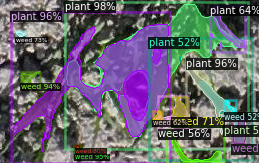

Predicted Image: weed_7_crop2.JPG


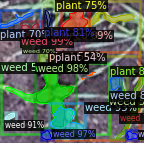

Predicted Image: weed_6_crop1.JPG


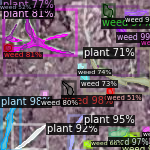

Predicted Image: weed_15_crop3.JPG


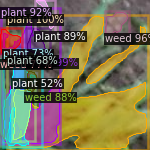

Predicted Image: weed_17_crop1.JPG


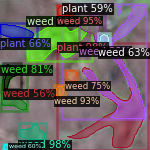

Predicted Image: weed_10_crop19.JPG


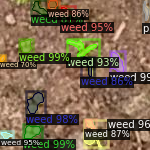

Predicted Image: weed_4_crop6.JPG


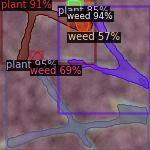

Predicted Image: weed_32_crop1.JPG


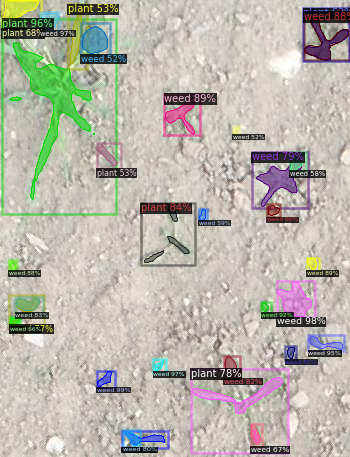

Predicted Image: weed_15_crop1.JPG


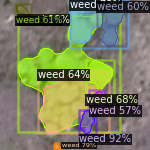

Predicted Image: weed_39_crop3.JPG


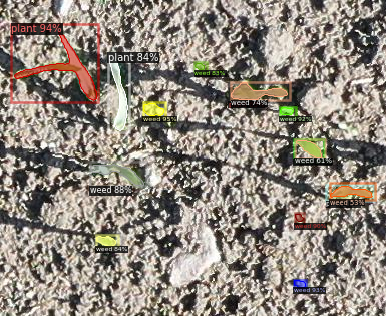

Predicted Image: weed_26_crop1.JPG


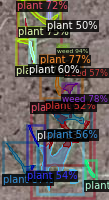

Predicted Image: weed_25_crop2.JPG


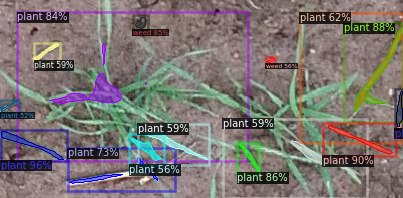

Predicted Image: weed_4_crop1.JPG


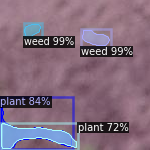

Predicted Image: weed_5_crop9.JPG


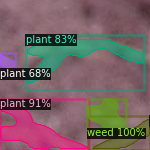

Predicted Image: weed_4_crop3.JPG


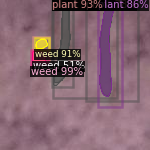

Predicted Image: weed_60_crop2.JPG


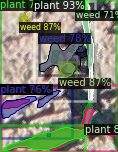

Predicted Image: weed_57_crop2.JPG


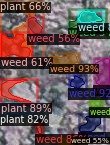

Predicted Image: weed_10_crop11.JPG


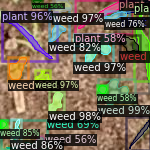

Predicted Image: weed_11_crop3.JPG


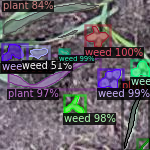

Predicted Image: weed_55_crop2.JPG


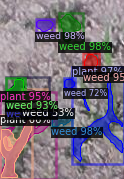

Predicted Image: weed_11_crop2.JPG


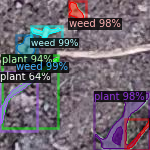

Predicted Image: weed_16_crop1.JPG


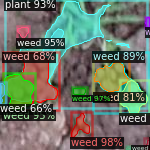

Predicted Image: weed_38_crop2.JPG


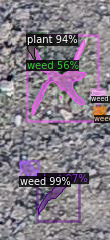

Predicted Image: weed_44_crop1.JPG


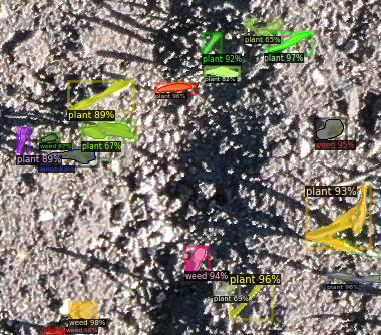

Predicted Image: DJI_0122_crop2.JPG


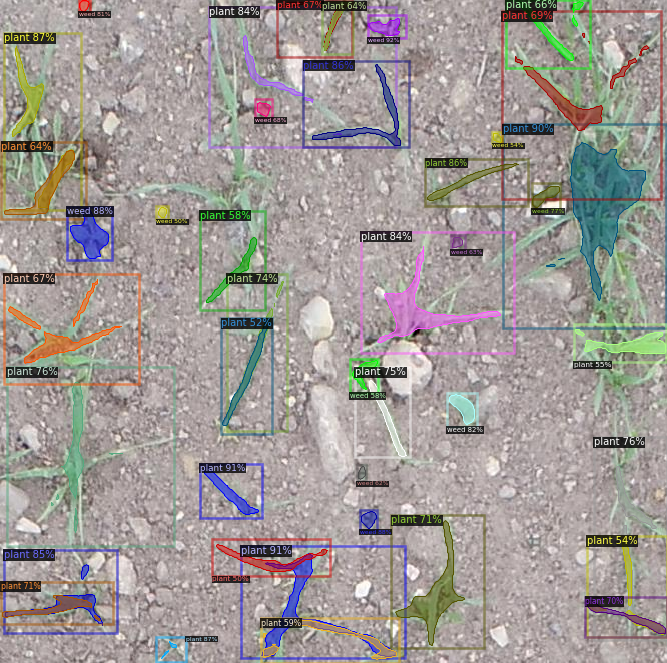

Predicted Image: weed_14_crop2.JPG


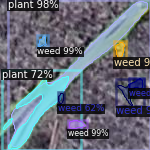

Predicted Image: weed_4_crop5.JPG


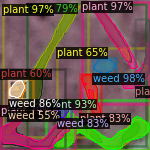

Predicted Image: weed_17_crop3.JPG


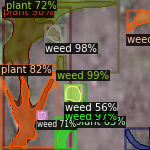

Predicted Image: weed_45_crop3.JPG


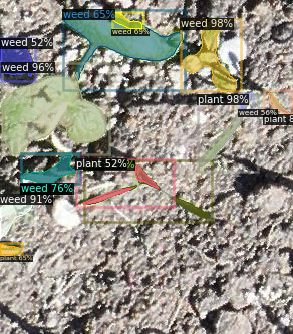

Predicted Image: weed_5_crop7.JPG


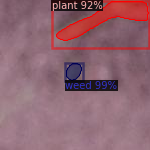

In [67]:
for d in test_dataset_dicts:
    visualize_detectron2_image(d, statement_metadata, predictor=predictor, save=False, path='test_set_result')

________________
__END__